<a href="https://colab.research.google.com/github/Lucs1590/study_segmentation/blob/main/instance_segmentation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Image Segmentation with Python from A to Z: Instance Segmentation

# Repository download

In [32]:
!git clone https://github.com/matterport/Mask_RCNN

fatal: destination path 'Mask_RCNN' already exists and is not an empty directory.


In [33]:
%cd Mask_RCNN/

/content/Mask_RCNN


In [34]:
!python setup.py install

/usr/local/lib/python3.7/dist-packages/setuptools/dist.py:700: UserWarning: Usage of dash-separated 'description-file' will not be supported in future versions. Please use the underscore name 'description_file' instead
  % (opt, underscore_opt))
/usr/local/lib/python3.7/dist-packages/setuptools/dist.py:700: UserWarning: Usage of dash-separated 'license-file' will not be supported in future versions. Please use the underscore name 'license_file' instead
  % (opt, underscore_opt))
/usr/local/lib/python3.7/dist-packages/setuptools/dist.py:700: UserWarning: Usage of dash-separated 'requirements-file' will not be supported in future versions. Please use the underscore name 'requirements_file' instead
  % (opt, underscore_opt))
running install
running bdist_egg
running egg_info
writing mask_rcnn.egg-info/PKG-INFO
writing dependency_links to mask_rcnn.egg-info/dependency_links.txt
writing top-level names to mask_rcnn.egg-info/top_level.txt
reading manifest template 'MANIFEST.in'
adding licens

In [35]:
%cd ..

/content


# Libraries Import

In [36]:
!pip install --upgrade h5py==2.10.0
!pip install tensorflow==1.15.2
!pip install tensorflow-gpu==1.15.0
!pip install q keras==2.1.0

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [37]:
import os
import sys
import random
import math
import cv2
import numpy as np
import skimage.io
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow

In [38]:
import tensorflow as tf

In [39]:
tf.__version__

'1.15.0'

In [40]:
ROOT_DIR = os.path.abspath('./Mask_RCNN/')
sys.path.append(ROOT_DIR)
sys.path.append(os.path.join(ROOT_DIR, 'samples/coco/'))
MODEL_DIR = os.path.join(ROOT_DIR, 'logs')
IMAGE_DIR = os.path.join(ROOT_DIR, 'images')
sys.path

['/content',
 '/env/python',
 '/usr/lib/python37.zip',
 '/usr/lib/python3.7',
 '/usr/lib/python3.7/lib-dynload',
 '',
 '/usr/local/lib/python3.7/dist-packages',
 '/usr/local/lib/python3.7/dist-packages/mask_rcnn-2.1-py3.7.egg',
 '/usr/lib/python3/dist-packages',
 '/usr/local/lib/python3.7/dist-packages/IPython/extensions',
 '/root/.ipython',
 '/content/Mask_RCNN',
 '/content/Mask_RCNN/samples/coco/',
 '/',
 '/',
 '/content/Mask_RCNN',
 '/content/Mask_RCNN/samples/coco/']

In [41]:
from mrcnn import utils
from mrcnn import visualize
import mrcnn.model as modellib
import coco

# Connecting to Google Drive

In [42]:
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [43]:
!cp -r /content/gdrive/MyDrive/image-segmentation-course/fotos images/

# Loading the Pre-trained Neural Network

In [44]:
COCO_MODEL_PATH = os.path.join(ROOT_DIR, 'mask_rcnn_coco.h5')

In [45]:
COCO_MODEL_PATH

'/content/Mask_RCNN/mask_rcnn_coco.h5'

In [46]:
if not os.path.exists(COCO_MODEL_PATH):
  utils.download_trained_weights(COCO_MODEL_PATH)

## Inference Settings

In [47]:
class InferenceConfig(coco.CocoConfig):
  GPU_COUNT = 1
  IMAGES_PER_GPU = 1
config = InferenceConfig()

In [48]:
config.display()


Configurations:
BACKBONE                       resnet101
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     1
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.7
DETECTION_NMS_THRESHOLD        0.3
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 1
IMAGE_CHANNEL_COUNT            3
IMAGE_MAX_DIM                  1024
IMAGE_META_SIZE                93
IMAGE_MIN_DIM                  800
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              square
IMAGE_SHAPE                    [1024 1024    3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
LOSS_WEIGHTS                   {'rpn_class_loss': 1.0, 'rpn_bbox_loss': 1.0, 'mrcnn_class_loss': 1.0, 'mrcnn_bbox_loss': 1.0, 'mrcnn_mask_loss': 1.0}
MASK_POOL_SIZE                 14
MASK_SHAPE         

# Creating the Model and Loading the Weights

In [49]:
MODEL_DIR

'/content/Mask_RCNN/logs'

In [50]:
model = modellib.MaskRCNN(mode='inference', config=config, model_dir=MODEL_DIR)

In [51]:
model.load_weights(COCO_MODEL_PATH, by_name=True)

# Class Name Definition

In [52]:
class_names = ['BG', 'person', 'bicycle', 'car', 'motorcycle', 'airplane',
               'bus', 'train', 'truck', 'boat', 'traffic light',
               'fire hydrant', 'stop sign', 'parking meter', 'bench', 'bird',
               'cat', 'dog', 'horse', 'sheep', 'cow', 'elephant', 'bear',
               'zebra', 'giraffe', 'backpack', 'umbrella', 'handbag', 'tie',
               'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball',
               'kite', 'baseball bat', 'baseball glove', 'skateboard',
               'surfboard', 'tennis racket', 'bottle', 'wine glass', 'cup',
               'fork', 'knife', 'spoon', 'bowl', 'banana', 'apple',
               'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza',
               'donut', 'cake', 'chair', 'couch', 'potted plant', 'bed',
               'dining table', 'toilet', 'tv', 'laptop', 'mouse', 'remote',
               'keyboard', 'cell phone', 'microwave', 'oven', 'toaster',
               'sink', 'refrigerator', 'book', 'clock', 'vase', 'scissors',
               'teddy bear', 'hair drier', 'toothbrush']

In [53]:
len(class_names)

81

# Prediction and Visualization

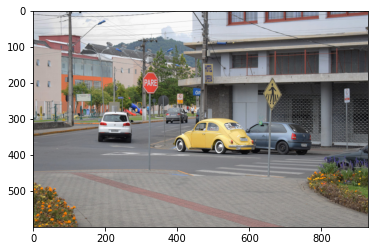

In [54]:
from skimage.io import imread
img = imread('images/cena-urbana01.jpg')
plt.imshow(img);

In [55]:
results = model.detect([img], verbose = 1)

Processing 1 images
image                    shape: (600, 930, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 93)               min:    0.00000  max: 1024.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


In [56]:
results

[{'rois': array([[306, 587, 401, 779],
         [280, 179, 366, 277],
         [170, 305, 229, 348],
         [295, 389, 398, 616],
         [267, 366, 314, 433],
         [468,   0, 600, 130],
         [234, 347, 264, 377]], dtype=int32),
  'class_ids': array([ 3,  3, 12,  3,  3, 59, 12], dtype=int32),
  'scores': array([0.9976985 , 0.99397945, 0.98793876, 0.98556167, 0.98454696,
         0.9003766 , 0.7543582 ], dtype=float32),
  'masks': array([[[False, False, False, ..., False, False, False],
          [False, False, False, ..., False, False, False],
          [False, False, False, ..., False, False, False],
          ...,
          [False, False, False, ..., False, False, False],
          [False, False, False, ..., False, False, False],
          [False, False, False, ..., False, False, False]],
  
         [[False, False, False, ..., False, False, False],
          [False, False, False, ..., False, False, False],
          [False, False, False, ..., False, False, False],
       

In [57]:
result_value = results[0]
result_value

{'rois': array([[306, 587, 401, 779],
        [280, 179, 366, 277],
        [170, 305, 229, 348],
        [295, 389, 398, 616],
        [267, 366, 314, 433],
        [468,   0, 600, 130],
        [234, 347, 264, 377]], dtype=int32),
 'class_ids': array([ 3,  3, 12,  3,  3, 59, 12], dtype=int32),
 'scores': array([0.9976985 , 0.99397945, 0.98793876, 0.98556167, 0.98454696,
        0.9003766 , 0.7543582 ], dtype=float32),
 'masks': array([[[False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         ...,
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False]],
 
        [[False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         ...,
         [Fals

In [58]:
print(result_value['class_ids'])

[ 3  3 12  3  3 59 12]


In [59]:
[class_names[x] for x in result_value['class_ids']]

['car', 'car', 'stop sign', 'car', 'car', 'potted plant', 'stop sign']

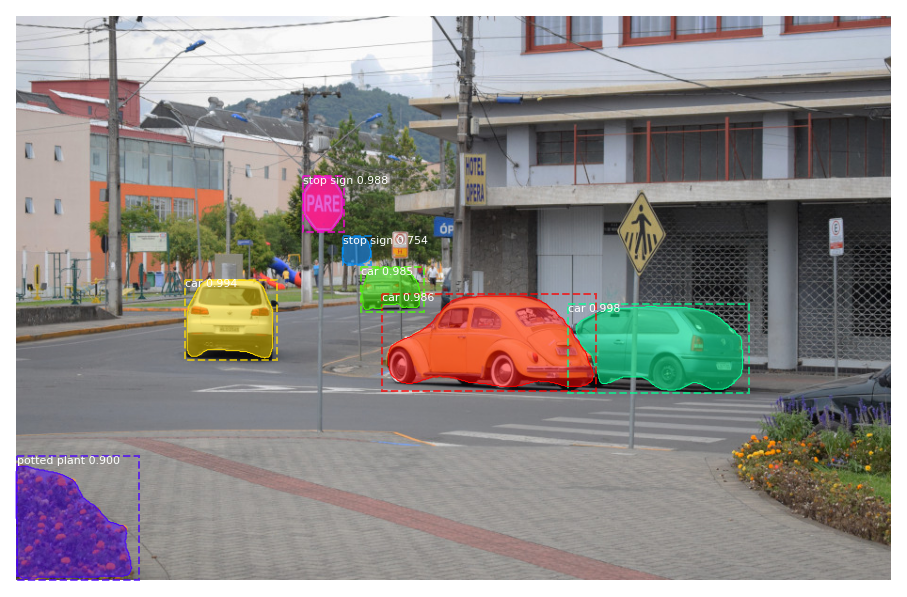

In [60]:
visualize.display_instances(img, result_value['rois'], result_value['masks'], result_value['class_ids'], class_names, result_value['scores'])

In [61]:
print('Segments detected: ', str(len(result_value['scores'])))

Segments detected:  7


In [62]:
result_value['scores']

array([0.9976985 , 0.99397945, 0.98793876, 0.98556167, 0.98454696,
       0.9003766 , 0.7543582 ], dtype=float32)

## With Functions

In [63]:
imgs = ['images/cena-urbana01.jpg', 'images/cena-urbana02.jpg',
        'images/pedestres01.jpg', 'images/pedestres02.jpg',
        'images/tenis01.jpg', 'images/futebol01.jpg',
        'images/quarto.jpg', 'images/jantar.jpg']

In [64]:
imgs = list(map(imread, imgs))

In [65]:
def show_imgs(images):
  for img in images:
    fig = plt.gcf()
    fig.set_size_inches(18,8)
    plt.imshow(img, cmap='gray')
    plt.axis('off')
    plt.show()

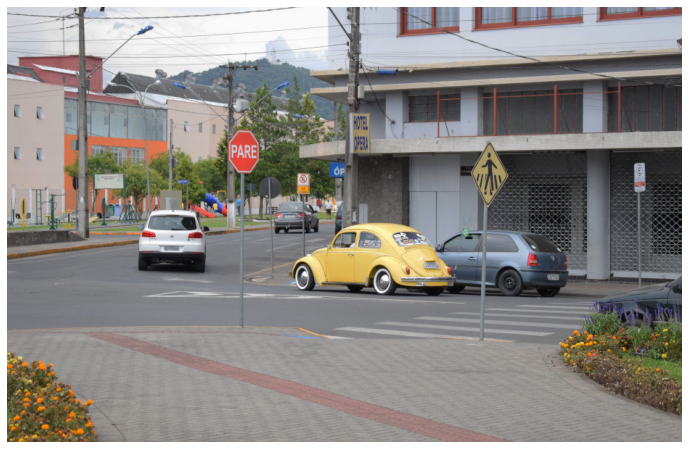

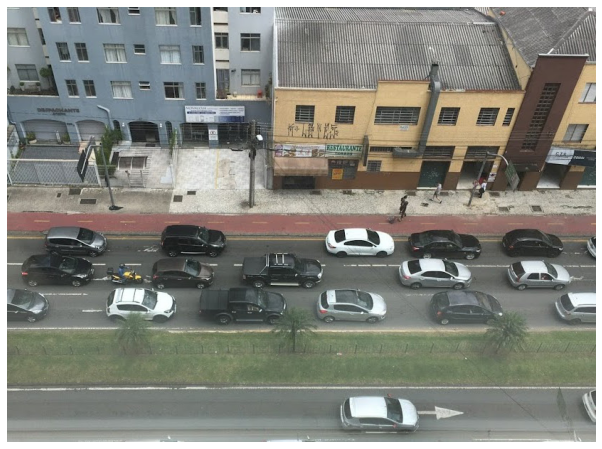

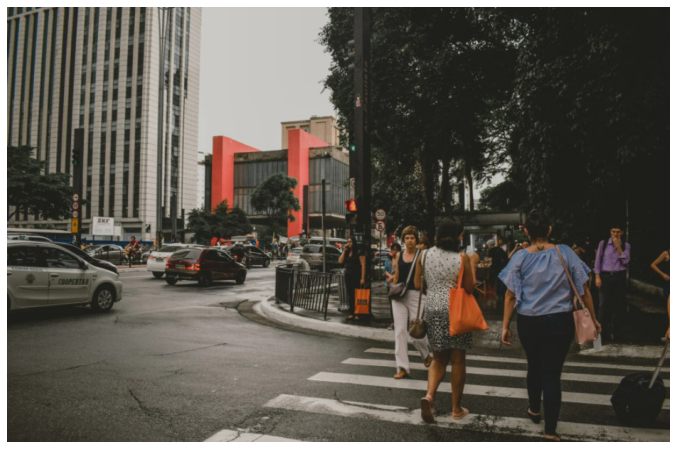

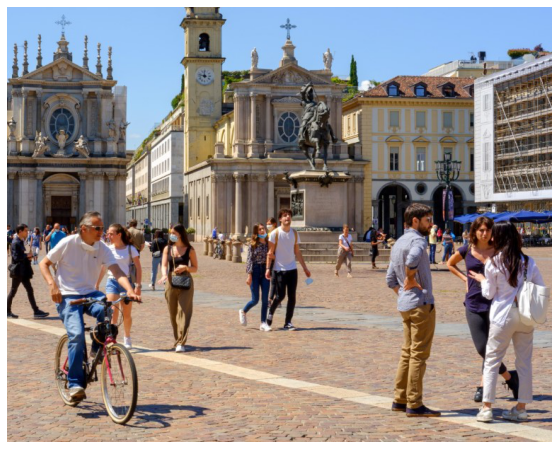

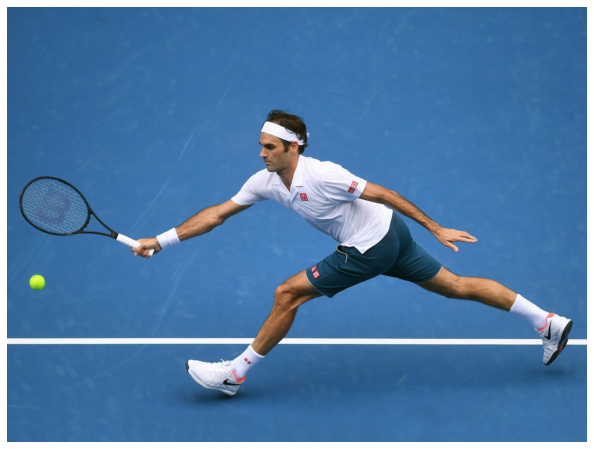

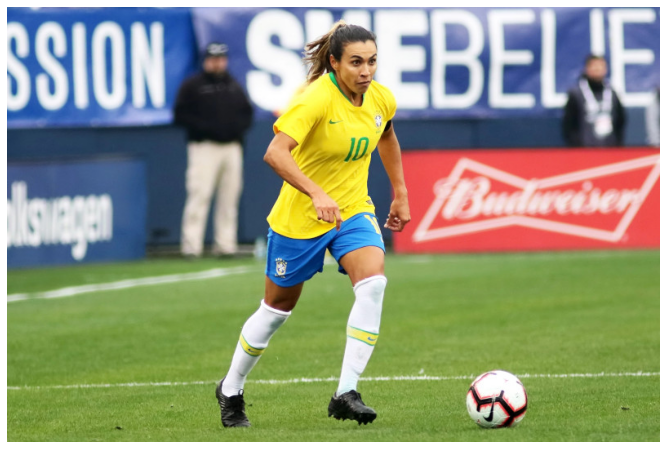

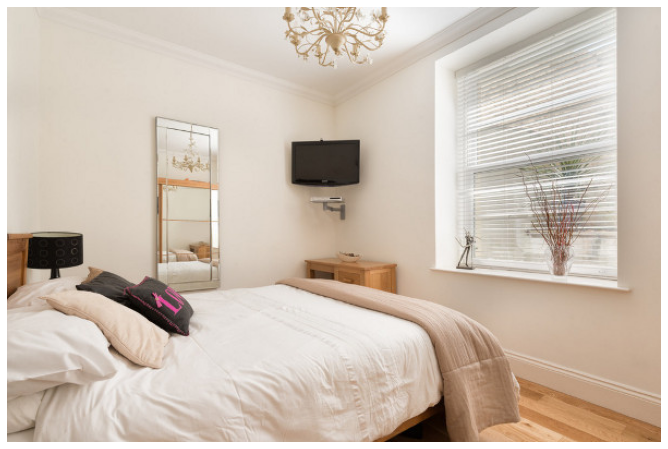

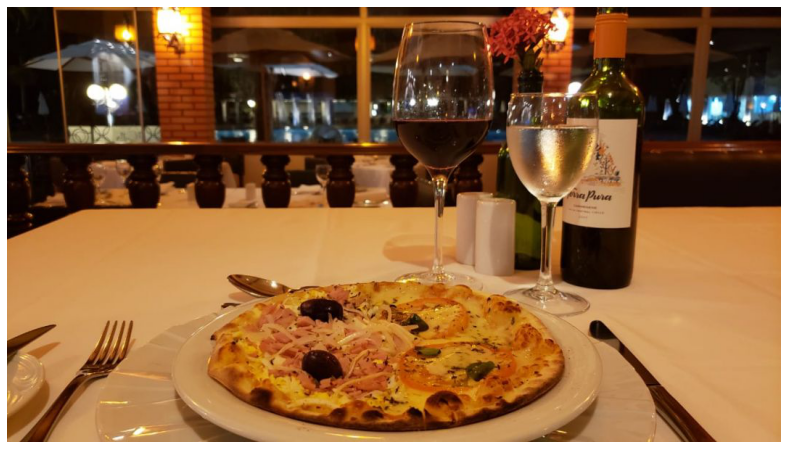

In [66]:
show_imgs(imgs)

In [67]:
def segment_images(images):
  result_values = []
  for img in images:
    results = model.detect([img], verbose = 0)
    rv = results[0]
    visualize.display_instances(img, rv['rois'], rv['masks'], rv['class_ids'], class_names, rv['scores'])
    print('Segments detected: ', len(rv['scores']))
    result_values.append(rv)
  return result_values

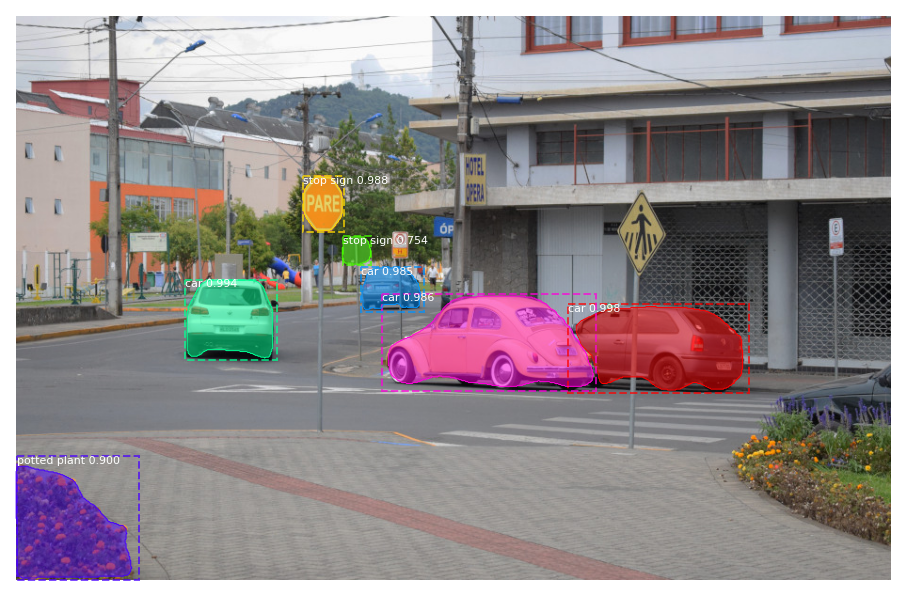

Segments detected:  7


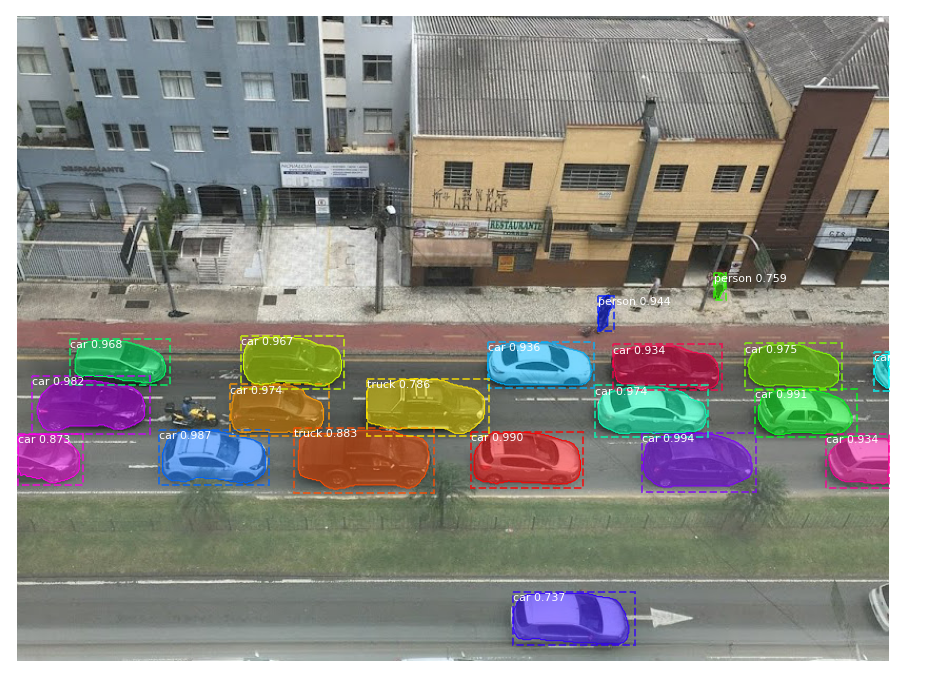

Segments detected:  20


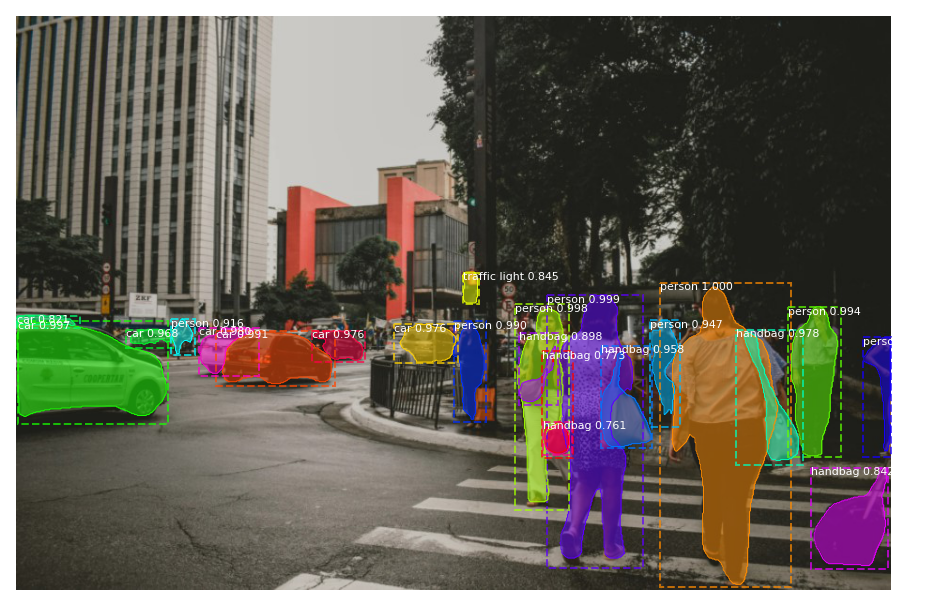

Segments detected:  22


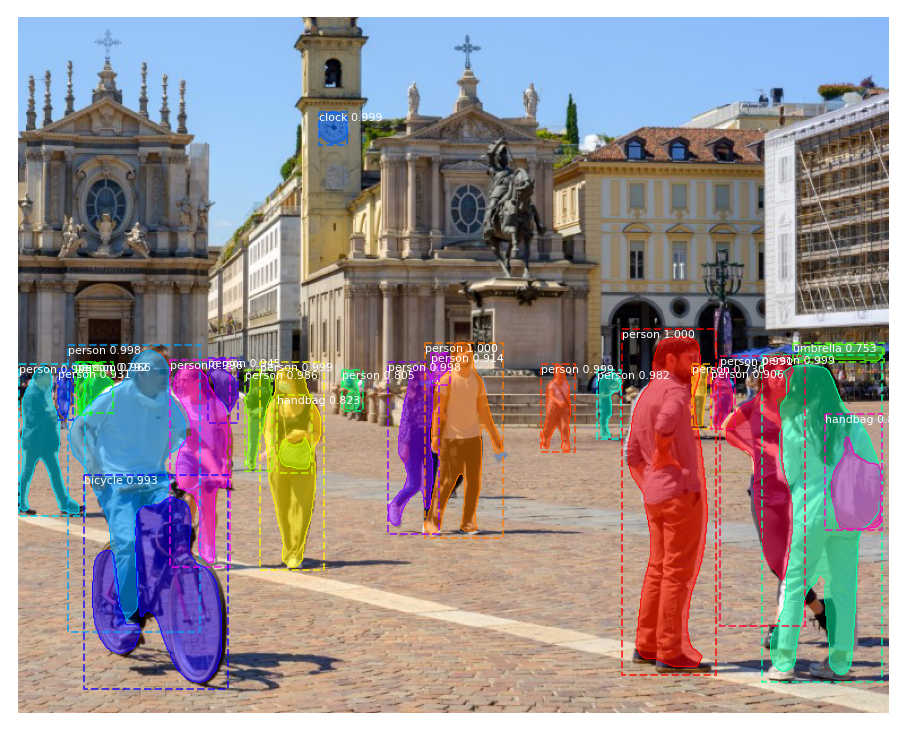

Segments detected:  25


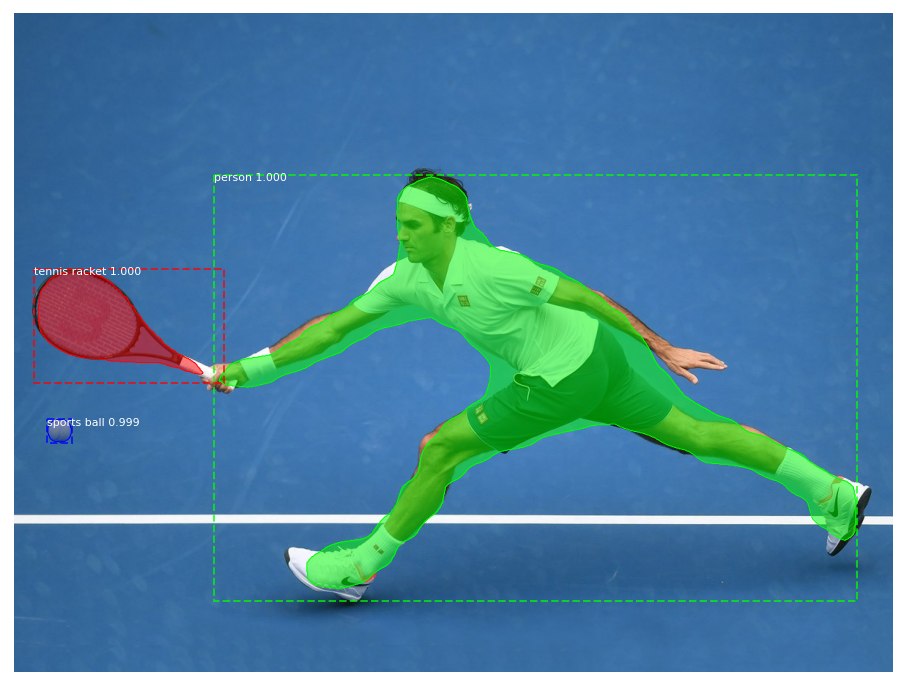

Segments detected:  3


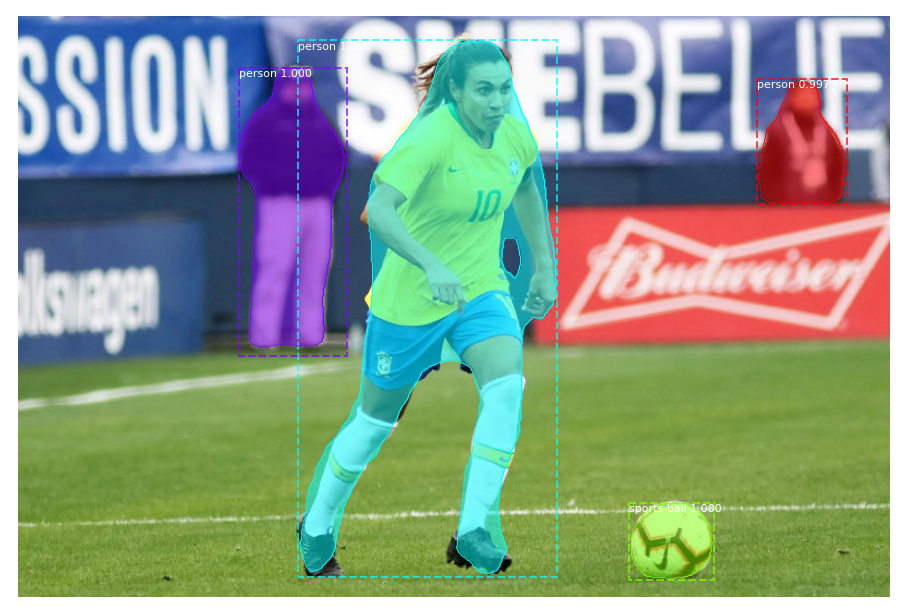

Segments detected:  4


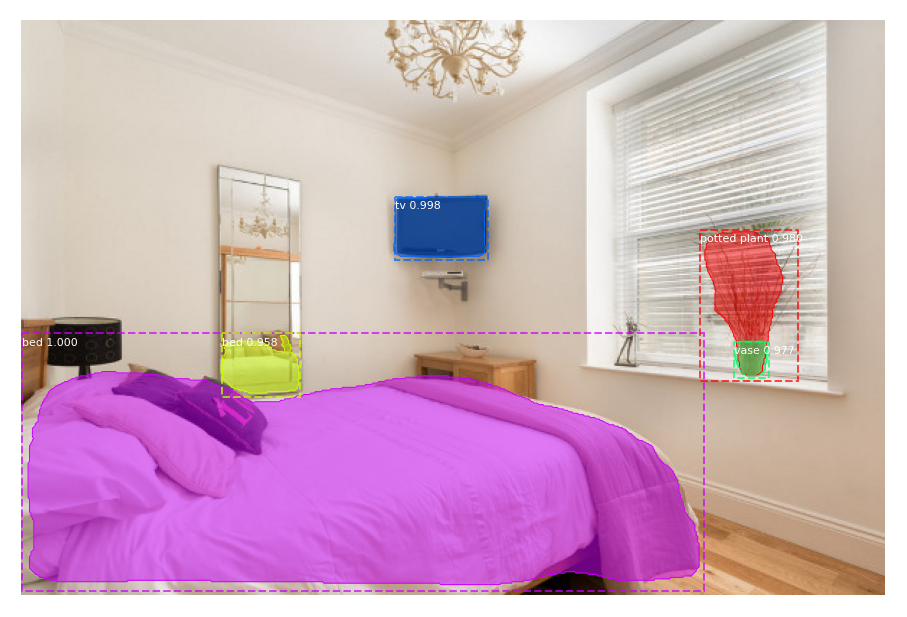

Segments detected:  5


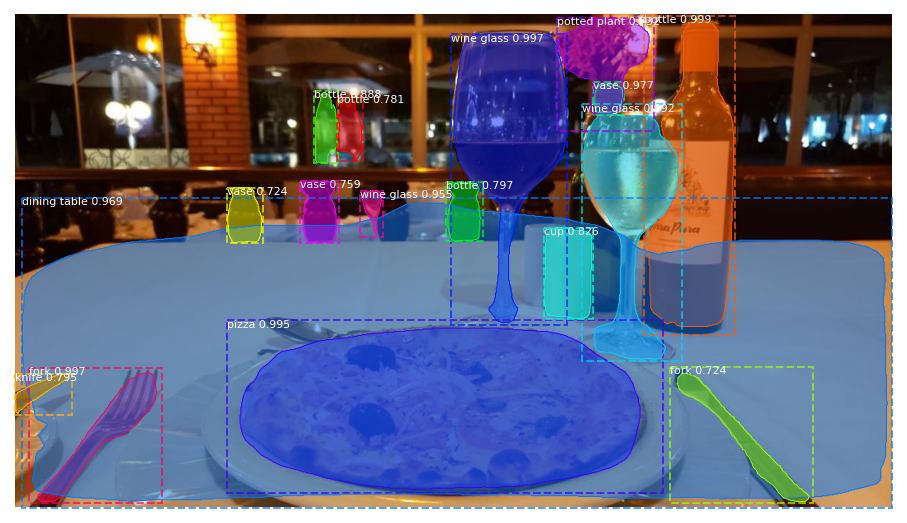

Segments detected:  17


In [68]:
result_values = segment_images(imgs)

In [69]:
result_values[5]['class_ids']

array([ 1, 33,  1,  1], dtype=int32)

# Background removal

In [70]:
def segment(img, result_value, idx):
  mask = result_value['masks'][:,:,idx]
  mask = np.stack((mask,)*3, axis = -1)
  mask = mask.astype('uint8')
  bg = 255 - mask * 255
  mask_show = np.invert(bg)
  mask_img = img * mask
  res = mask_img + bg
  return res, mask_show

In [71]:
segmentation, mask_obj = segment(imgs[3], result_values[3], 3)

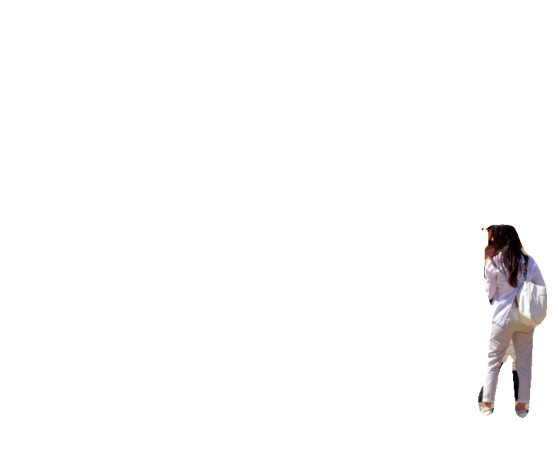

In [72]:
show_imgs([segmentation])

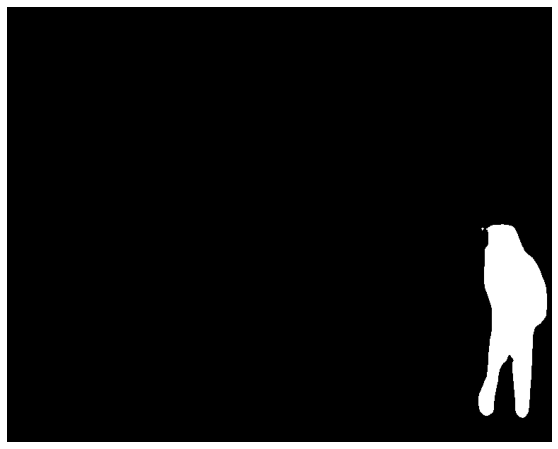

In [73]:
show_imgs([mask_obj])

In [74]:
def show_segmentation(img, result_value, idx, show_mask = False):
  segmentacao, mask_obj = segment(img, result_value, idx)
  plt.subplots(1, figsize=(16,16))
  plt.axis('off')
  if show_mask:
    plt.imshow(np.concatenate([mask_obj, segmentacao], axis = 1))
  else:
    plt.imshow(np.concatenate([img, segmentacao], axis = 1))

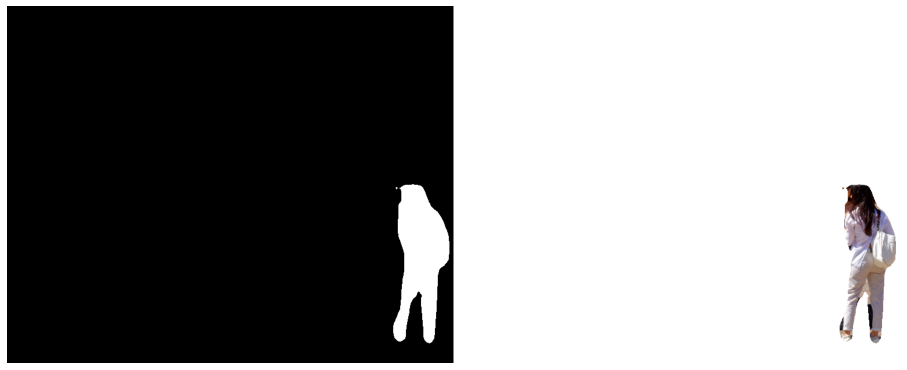

In [75]:
show_segmentation(imgs[3], result_values[3], 3, show_mask = True)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until


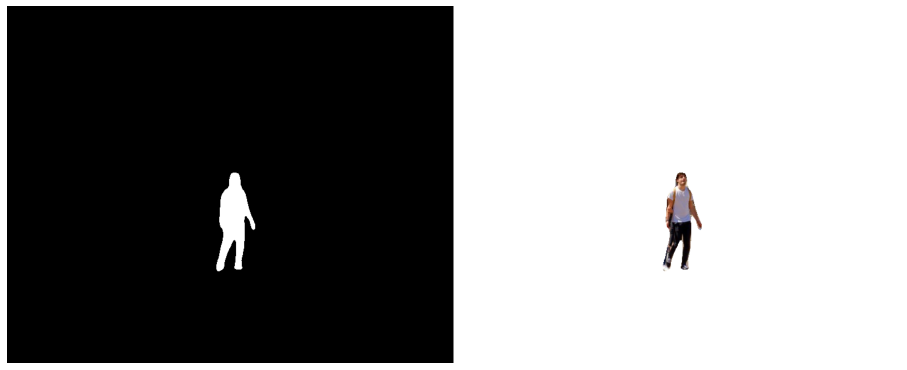

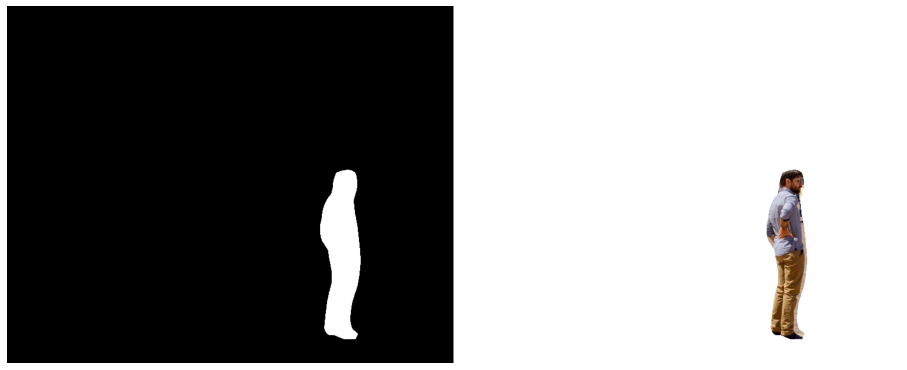

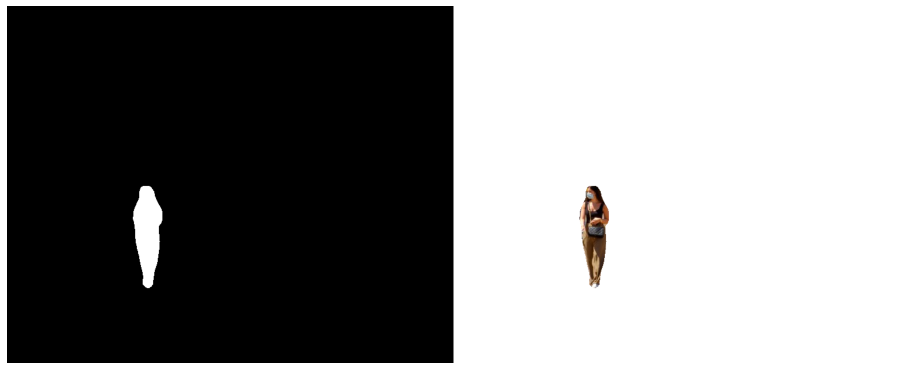

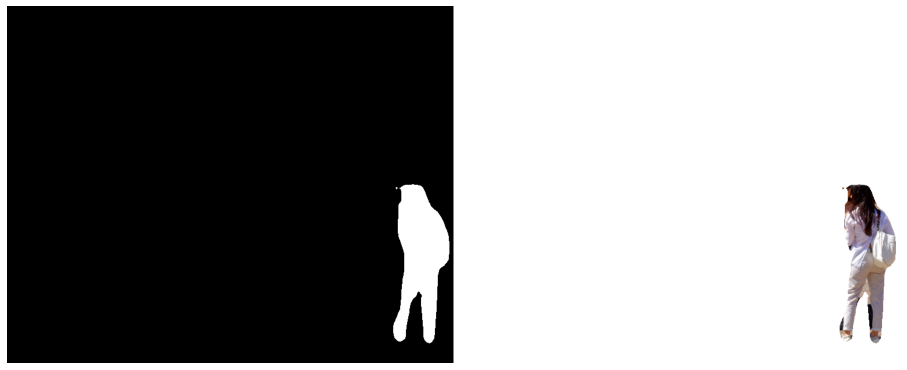

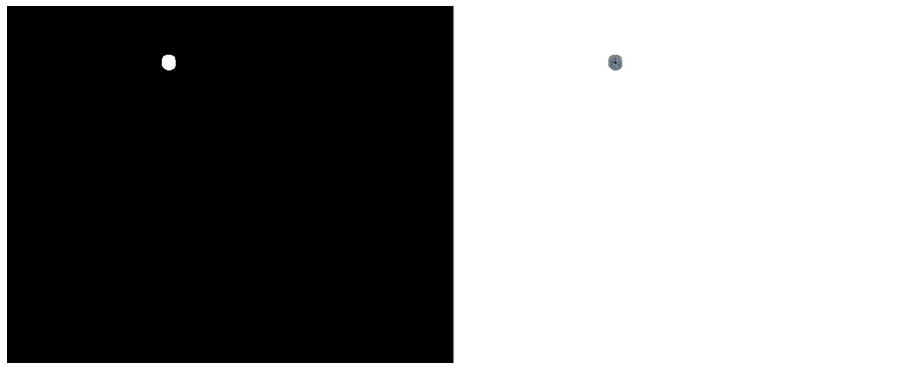

...

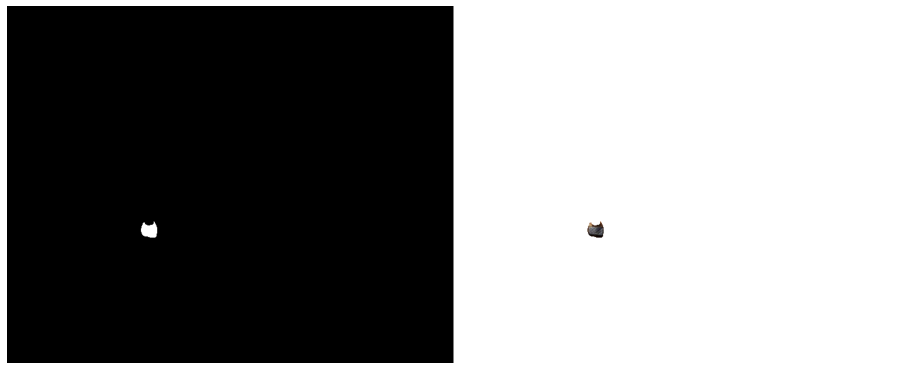

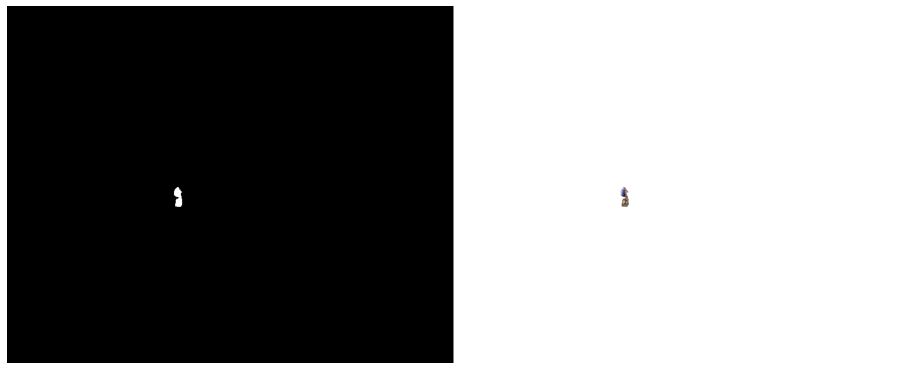

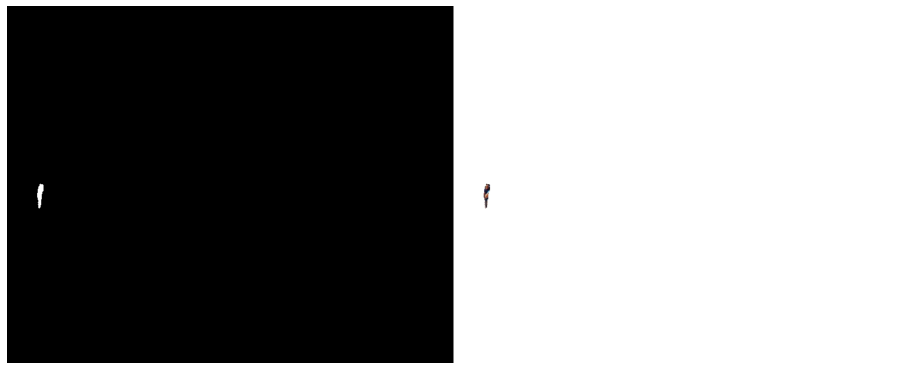

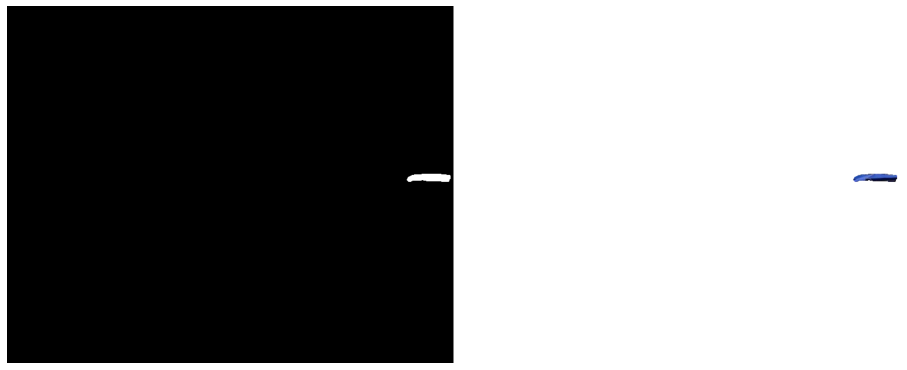

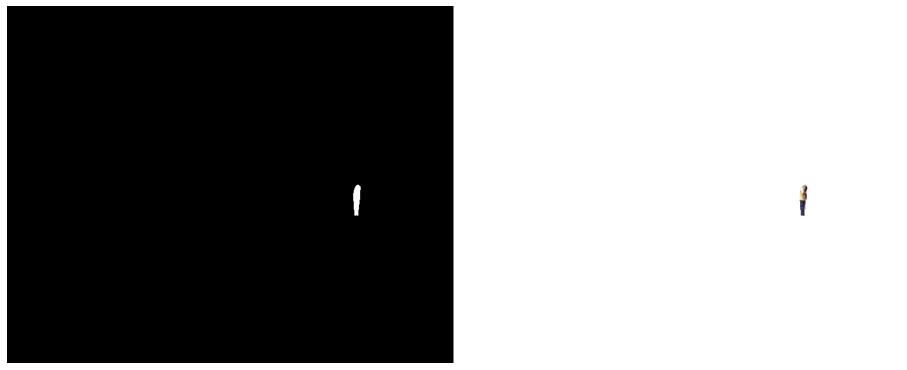

In [76]:
for indice, roi in enumerate(result_values[3]['rois']):
  show_segmentation(imgs[3], result_values[3], indice, True)

# Object Count

In [77]:
object_class = 'person'
class_id = class_names.index(object_class)
class_name = class_names[class_id]
print(class_id, class_name)


1 person


In [78]:
all_images_path = [os.path.join('images/', img) for img in os.listdir('images/')]
all_images_path

['images/baloes_teste_03_.jpg',
 'images/pedestres03.jpg',
 'images/futebol01.jpg',
 'images/baloes_teste02.jpg',
 'images/fotos',
 'images/quarto.jpg',
 'images/garota-e-cachorro.jpg',
 'images/tenis03.jpg',
 'images/pedestres04.jpg',
 'images/driveseg_amostra.jpg',
 'images/motocross.jpg',
 'images/baloes_teste01.jpg',
 'images/jantar.jpg',
 'images/cena-urbana03.jpg',
 'images/elefante.jpg',
 'images/tenis02.jpg',
 'images/cena-urbana01.jpg',
 'images/tenis01.jpg',
 'images/pedestres01.jpg',
 'images/pedestres02.jpg',
 'images/cena-urbana02.jpg',
 'images/rua_amostra.jpg']

In [81]:
total = 0
print('Class: ', class_name)
for img_path in all_images_path:
  try:
    img = imread(img_path)
    results = model.detect([img], verbose=0)
    result = results[0]
    number = np.count_nonzero(result['class_ids'] == class_id)
    total = total + number
    print(f'{img_path} -> {number} {class_name}')
  except:
    ...

Class:  person
images/baloes_teste_03_.jpg -> 0 person
images/pedestres03.jpg -> 20 person
images/futebol01.jpg -> 3 person
images/baloes_teste02.jpg -> 1 person
images/quarto.jpg -> 0 person
images/garota-e-cachorro.jpg -> 1 person
images/tenis03.jpg -> 1 person
images/pedestres04.jpg -> 1 person
images/driveseg_amostra.jpg -> 4 person
images/motocross.jpg -> 57 person
images/baloes_teste01.jpg -> 10 person
images/jantar.jpg -> 0 person
images/cena-urbana03.jpg -> 2 person
images/elefante.jpg -> 0 person
images/tenis02.jpg -> 5 person
images/cena-urbana01.jpg -> 0 person
images/tenis01.jpg -> 1 person
images/pedestres01.jpg -> 8 person
images/pedestres02.jpg -> 20 person
images/cena-urbana02.jpg -> 2 person
images/rua_amostra.jpg -> 4 person


In [82]:
print(f'{total} {class_name}')

140 person
